# astronomix MHD example - stellar wind in the turbulent ISM

Let us simulate stellar wind in the turbulent ISM :) At $64^3$ cells the whole notebook should complete a few minutes :D

**Hint: Make sure to run on GPU.**

## Imports

In [1]:
# ==== GPU selection ====
from autocvd import autocvd
autocvd(num_gpus = 1)
# ruff: noqa: E402
# =======================

import jax
import jax.numpy as jnp
import os
import re

# astronomix constants
from astronomix import (
    FINITE_DIFFERENCE,
    PERIODIC_BOUNDARY,
)

# astronomix containers
from astronomix import (
    SimulationConfig,
    PositivityConfig,
    BoundarySettings,
    BoundarySettings1D,
    SimulationParams,
    WindParams,
    CodeUnits,
)
from astronomix.option_classes import WindConfig
from astronomix._modules._turbulent_forcing._turbulent_forcing_options import (
    TurbulentForcingConfig,
    TurbulentForcingParams,
)

# astronomix functions
from astronomix import (
    get_registered_variables,
    get_helper_data,
    construct_primitive_state,
    time_integration,
    initialize_interface_fields,
    finalize_config,
)

# units
from astropy import units as u
import astropy.constants as c

# plotting
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import imageio.v3 as iio
from IPython.display import Image

## Simulation setup

In [2]:
# simulation settings
gamma = 5/3

# spatial domain
box_size = 1.0
num_cells = 64

# activate stellar wind
stellar_wind = False

# turbulence
turbulence = True

# otherwise B = 0.0
mhd = True

app_string = "driven_turb_wind"

# baseline simulation config
config = SimulationConfig(
    solver_mode = FINITE_DIFFERENCE,
    mhd = True,
    progress_bar = True,
    positivity_config = PositivityConfig(default_positivity_protection = True),
    donate_state = True, # save storage
    dimensionality = 3,
    box_size = box_size,
    num_cells = num_cells,
    turbulent_forcing_config = TurbulentForcingConfig(
        turbulent_forcing = turbulence,
    ),
    boundary_settings =  BoundarySettings(
        BoundarySettings1D(
            left_boundary = PERIODIC_BOUNDARY,
            right_boundary = PERIODIC_BOUNDARY
        ),
        BoundarySettings1D(
            left_boundary = PERIODIC_BOUNDARY,
            right_boundary = PERIODIC_BOUNDARY
        ),
        BoundarySettings1D(
            left_boundary = PERIODIC_BOUNDARY,
            right_boundary = PERIODIC_BOUNDARY
        )
    ),
    # animation
    activate_snapshot_callback = True,
    num_snapshots = 100
)

# get the variable registry
registered_variables = get_registered_variables(config)

# unit setup
code_length = 3 * u.parsec
code_mass = 1 * u.M_sun
code_velocity = 100 * u.km / u.s
code_units = CodeUnits(code_length, code_mass, code_velocity)

# time domain
C_CFL = 0.8

# wind parameters
M_star = 40 * u.M_sun
wind_final_velocity = 2000 * u.km / u.s
wind_mass_loss_rate = 2.965e-3 / (1e6 * u.yr) * M_star

wind_params = WindParams(
    wind_mass_loss_rate = wind_mass_loss_rate.to(code_units.code_mass / code_units.code_time).value,
    wind_final_velocity = wind_final_velocity.to(code_units.code_velocity).value
)

params = SimulationParams(
    C_cfl = C_CFL,
    dt_max = 0.1,
    gamma = gamma,
    minimum_density=1e-3,
    minimum_pressure=1e-3,
    wind_params = wind_params,
    turbulent_forcing_params = TurbulentForcingParams(
        energy_injection_rate = 0.2
    ),
)

print((0.2 * code_units.code_energy / code_units.code_time).to(u.erg / u.s))

# homogeneous initial state
rho_0 = 2 * c.m_p / u.cm**3
p_0 = 3e4 * u.K / u.cm**3 * c.k_B

rho = jnp.ones((config.num_cells, config.num_cells, config.num_cells)) * rho_0.to(code_units.code_density).value
u_x = jnp.zeros((config.num_cells, config.num_cells, config.num_cells))
u_y = jnp.zeros((config.num_cells, config.num_cells, config.num_cells))
u_z = jnp.zeros((config.num_cells, config.num_cells, config.num_cells))
p = jnp.ones((config.num_cells, config.num_cells, config.num_cells)) * p_0.to(code_units.code_pressure).value

if mhd:
    B_0 = 13.5 * u.microgauss / c.mu0**0.5
    B_0 = B_0.to(code_units.code_magnetic_field).value
else:
    B_0 = 0.0

B_x = jnp.ones((config.num_cells, config.num_cells, config.num_cells)) * B_0
B_y = jnp.zeros((config.num_cells, config.num_cells, config.num_cells))
B_z = jnp.zeros((config.num_cells, config.num_cells, config.num_cells))
bxb, byb, bzb = initialize_interface_fields(B_x, B_y, B_z)

# construct primitive state
initial_state = construct_primitive_state(
    config = config,
    registered_variables=registered_variables,
    density = rho,
    velocity_x = u_x,
    velocity_y = u_y,
    velocity_z = u_z,
    gas_pressure = p,
    magnetic_field_x = B_x,
    magnetic_field_y = B_y,
    magnetic_field_z = B_z,
    interface_magnetic_field_x = bxb,
    interface_magnetic_field_y = byb,
    interface_magnetic_field_z = bzb,
)

config = finalize_config(config, initial_state.shape)

4.295998351923327e+34 erg / s
OPTIMAL_BACKEND: using the PALLAS backend (GPU compute capability >= 8.0).
For 3D simulations with periodic boundaries, setting boundary handling to PERIODIC_ROLL and num_ghost_cells to 0 for better performance.
Setting time integrator to RK4_SSP for finite difference solver mode.


## Prepare saving frames for GIF

In [3]:
import os

# create folder for frames
os.makedirs('turb_frames', exist_ok=True)
os.makedirs('wind_frames', exist_ok=True)

# empty the folders
for filename in os.listdir('turb_frames'):
  os.remove(os.path.join('turb_frames', filename))
for filename in os.listdir('wind_frames'):
  os.remove(os.path.join('wind_frames', filename))

def save_frame(
  time,
  state,
  registered_variables,
  directory
):

  def plot_slices(density, pressure, time):

    print(f"plotting slice at t = {time}")

    fig, (ax1, ax3) = plt.subplots(1, 2, figsize=(8, 4))

    # equal aspect ratio
    ax1.set_aspect('equal', 'box')
    # ax2.set_aspect('equal', 'box')
    ax3.set_aspect('equal', 'box')

    # remove x and y ticks
    for ax in [ax1, ax3]:
      ax.set_xticks([])
      ax.set_yticks([])

    z_level = num_cells // 2

    im1 = ax1.imshow(density.T, origin = "lower", extent = [0, 1, 0, 1], norm = LogNorm())
    ax1.set_title("density")

    # im2 = ax2.imshow(velocity.T, origin = "lower", extent = [0, 1, 0, 1])
    # ax2.set_title("velocity magnitude")

    im3 = ax3.imshow(pressure.T, origin = "lower", extent = [0, 1, 0, 1], norm = LogNorm())
    ax3.set_title("pressure")

    fig.savefig(
      f"{directory}/frame{time}.png",
      dpi=150,
      bbox_inches="tight",
      pad_inches=0
    )

    plt.close(fig)

  num_vars, nx, ny, nz = state.shape
  z_level = num_cells // 2

  density = state[registered_variables.density_index, :, :, z_level]
  # velocity = jnp.sqrt(state[registered_variables.velocity_index.x, :, :, z_level]**2 + state[registered_variables.velocity_index.y, :, :, z_level]**2 + state[registered_variables.velocity_index.z, :, :, z_level]**2)
  pressure = state[registered_variables.pressure_index, :, :, z_level]

  jax.debug.callback(
      plot_slices,
      density, pressure, time,
  )

save_turb_frame = lambda time, state, registered_variables: save_frame(time, state, registered_variables, 'turb_frames')
save_wind_frame = lambda time, state, registered_variables: save_frame(time, state, registered_variables, 'wind_frames')

## Turbulence only run

### Parameter adaptation

In [4]:
t_final = 6.0 * 1e4 * u.yr
t_end = t_final.to(code_units.code_time).value

# set the final time
params = params._replace(
    t_end = t_end,
)

### Running the simulation

In [5]:
turb_state = time_integration(initial_state, config, params, registered_variables, save_turb_frame)

plotting slice at t = 0.0
plotting slice at t = 0.0283597931265831--------------------------------| 1.4%  
plotting slice at t = 0.04713613539934158-------------------------------| 2.3%  
plotting slice at t = 0.06446469575166702-------------------------------| 3.2%  
plotting slice at t = 0.0879751518368721--------------------------------| 4.3%  
plotting slice at t = 0.1028243824839592--------------------------------| 5.0%  
plotting slice at t = 0.12407807260751724-------------------------------| 6.1%  
plotting slice at t = 0.14407825469970703-------------------------------| 7.0%  
plotting slice at t = 0.16847829520702362-------------------------------| 8.2%  
plotting slice at t = 0.18567919731140137-------------------------------| 9.1%  
plotting slice at t = 0.2088324874639511-------------------------------| 10.2%  
plotting slice at t = 0.22603651881217957------------------------------| 11.1%  
plotting slice at t = 0.24801519513130188------------------------------| 12.1%  
pl

### Plotting

Text(0.5, 1.0, 'pressure')

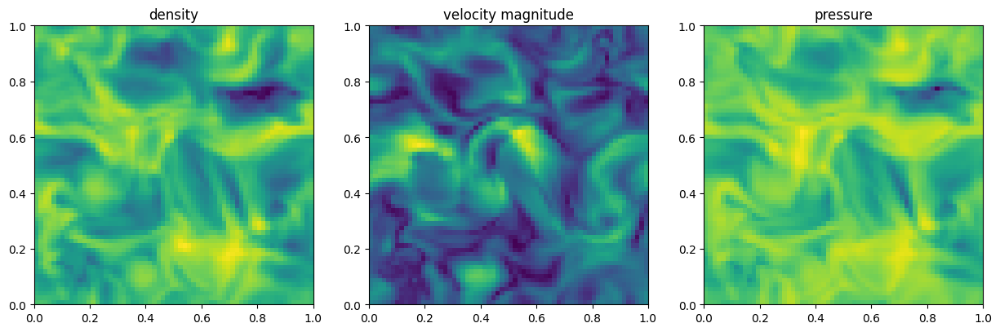

In [6]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

# equal aspect ratio
ax1.set_aspect('equal', 'box')
ax2.set_aspect('equal', 'box')
ax3.set_aspect('equal', 'box')

z_level = num_cells // 2

ax1.imshow(turb_state[registered_variables.density_index, :, :, z_level].T, origin = "lower", extent = [0, 1, 0, 1], norm = LogNorm())
ax1.set_title("density")

ax2.imshow(jnp.sqrt(turb_state[registered_variables.velocity_index.x, :, :, z_level]**2 + turb_state[registered_variables.velocity_index.y, :, :, z_level]**2 + turb_state[registered_variables.velocity_index.z, :, :, z_level]**2).T, origin = "lower", extent = [0, 1, 0, 1])
ax2.set_title("velocity magnitude")

ax3.imshow(turb_state[registered_variables.pressure_index, :, :, z_level].T, origin = "lower", extent = [0, 1, 0, 1], norm = LogNorm())
ax3.set_title("pressure")

## Let us introduce stellar wind

### Parameter adaptation

In [7]:
# then stellar wind + turbulence
t_final = 0.5 * 1e4 * u.yr
t_end = t_final.to(code_units.code_time).value
print(t_end)
config = config._replace(
    wind_config = WindConfig(
        stellar_wind = True,
        num_injection_cells = 4,
    ),
)
params = params._replace(
    t_end = t_end,
    minimum_density = 1e-3,
    minimum_pressure = 1e-3,
)

0.17045202750761582


### Running the simulation

In [8]:
final_state = time_integration(turb_state, config, params, registered_variables, save_wind_frame)

plotting slice at t = 0.0
plotting slice at t = 0.0019810188096016645-----------------------------| 1.2%  
plotting slice at t = 0.0038320347666740417-----------------------------| 2.2%  
plotting slice at t = 0.005379598122090101------------------------------| 3.2%  
plotting slice at t = 0.008022702299058437------------------------------| 4.7%  
plotting slice at t = 0.009201617911458015------------------------------| 5.4%  
plotting slice at t = 0.010303299874067307------------------------------| 6.0%  
plotting slice at t = 0.012289786711335182------------------------------| 7.2%  
plotting slice at t = 0.014082222245633602------------------------------| 8.3%  
plotting slice at t = 0.015736715868115425------------------------------| 9.2%  
plotting slice at t = 0.017279885709285736-----------------------------| 10.1%  
plotting slice at t = 0.01944713294506073------------------------------| 11.4%  
plotting slice at t = 0.020814938470721245-----------------------------| 12.2%  
pl

### Plotting

Text(0.5, 1.0, 'pressure')

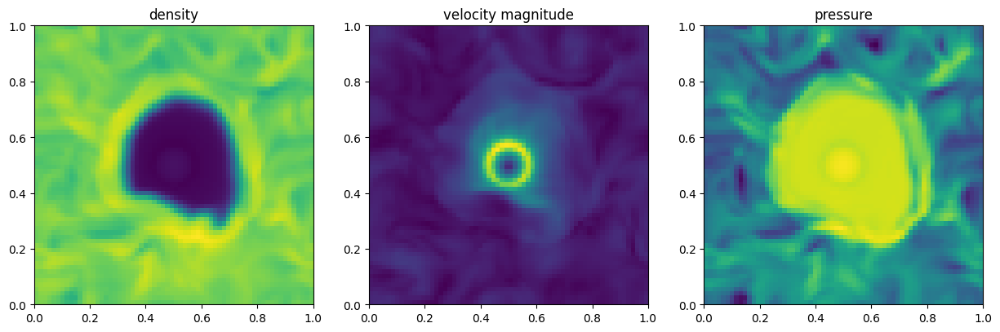

In [9]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

# equal aspect ratio
ax1.set_aspect('equal', 'box')
ax2.set_aspect('equal', 'box')
ax3.set_aspect('equal', 'box')

z_level = num_cells // 2

ax1.imshow(final_state[registered_variables.density_index, :, :, z_level].T, origin = "lower", extent = [0, 1, 0, 1], norm = LogNorm())
ax1.set_title("density")

ax2.imshow(jnp.sqrt(final_state[registered_variables.velocity_index.x, :, :, z_level]**2 + final_state[registered_variables.velocity_index.y, :, :, z_level]**2 + final_state[registered_variables.velocity_index.z, :, :, z_level]**2).T, origin = "lower", extent = [0, 1, 0, 1])
ax2.set_title("velocity magnitude")

ax3.imshow(final_state[registered_variables.pressure_index, :, :, z_level].T, origin = "lower", extent = [0, 1, 0, 1], norm = LogNorm())
ax3.set_title("pressure")

## Make animations

In [10]:
def get_sorted_frames(directory):
    files = [f for f in os.listdir(directory) if f.endswith('.png')]
    # Extract numerical timestamp from filename (e.g., frame0.123.png -> 0.123)
    # and sort by it
    files.sort(key=lambda f: float(re.search(r'frame([0-9.]+)\.png', f).group(1)))
    return [os.path.join(directory, f) for f in files]

turb_frames = get_sorted_frames('turb_frames')
wind_frames = get_sorted_frames('wind_frames')

all_frames = turb_frames + wind_frames

# Read all images into a list
images = [iio.imread(frame) for frame in all_frames]

# Create GIF
gif_path = 'simulation_animation.gif'
iio.imwrite(gif_path, images, duration=int(1000/30), loop=0)

print(f"GIF created at: {gif_path}")

GIF created at: simulation_animation.gif


**No check the gif created under the files tab (simulation_animation.gif) :)**

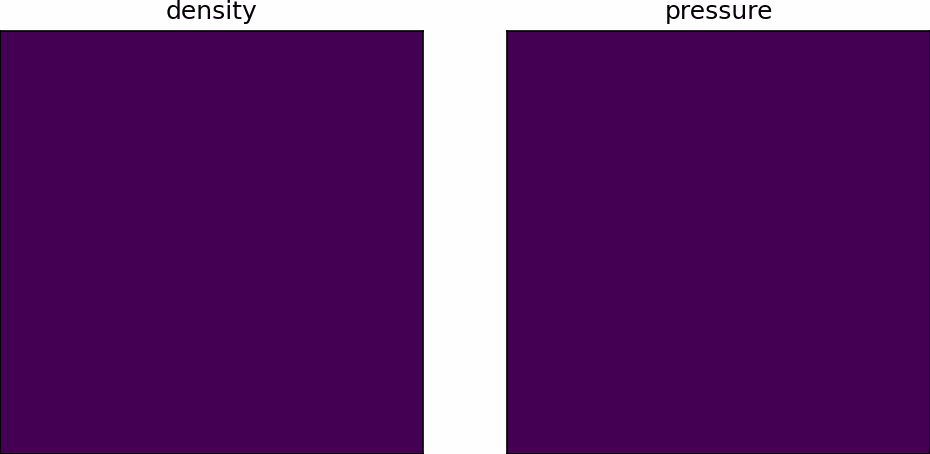

In [11]:
Image(filename='simulation_animation.gif')